# Chapter 6: More Image Enhancement

## Problems

## 1. Object detection with Hough Transform and Colors

### 1.1 Counting cirular objects in an image with Circle Hough Transform

In [1]:
from IPython.core.display import display,HTML
display(HTML('<style>.prompt{width: 0px; min-width: 0px; visibility: collapse}</style>'))

In [1]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.color import rgb2gray
from skimage.transform import hough_circle, hough_circle_peaks
from skimage.feature import canny
from skimage.draw import circle_perimeter
from skimage.util import img_as_ubyte
from sklearn.neighbors import KDTree

In [2]:
orig = imread('images/Img_06_01.jpg')
h, w = orig.shape[:2]
image = rgb2gray(orig)
edges = canny(image, sigma=1, low_threshold=0.15, high_threshold=0.45)

In [3]:
hough_radii = np.arange(10, 20, 1)
hough_res = hough_circle(edges, hough_radii)

accums, cx, cy, radii = hough_circle_peaks(hough_res, hough_radii,
                                           min_xdistance = 10,
                                           min_ydistance = 10,
                                           #num_peaks = 5,
                                           total_num_peaks=400)

In [4]:
cells = []
image = orig.copy()
for center_y, center_x, radius in zip(cy, cx, radii):
    circy, circx = circle_perimeter(center_y, center_x, radius, shape=image.shape)
    if len(cells) > 1:
        tree = KDTree(np.array(cells), leaf_size=2) 
        count = tree.query_radius(np.array([[center_y, center_x]]), r=10, count_only=True)
        if count[0] > 0: continue
    cells.append([center_y, center_x])
    for j in range(-3,4):
        image[np.minimum(circy+j,h-1), np.minimum(circx+j,w-1)] = (255, 0, 0)

172


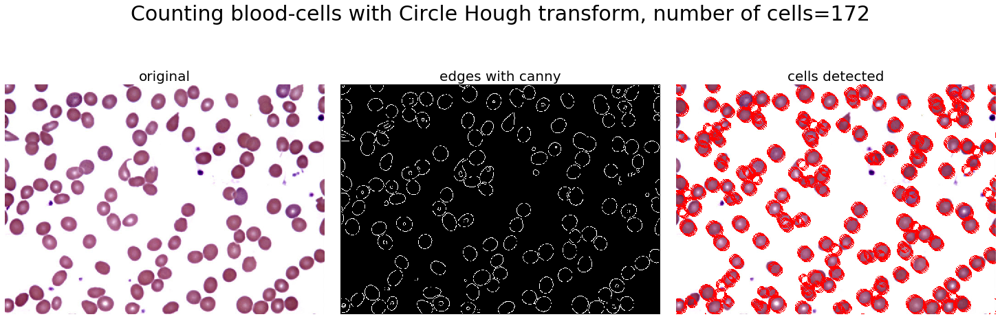

In [7]:
print(len(cx))

plt.figure(figsize=(20, 8))
plt.gray()
plt.subplots_adjust(0,0,1,0.975,0.05,0.05)
plt.subplot(131), plt.imshow(orig), plt.axis('off'), plt.title('original', size=20)
plt.subplot(132), plt.imshow(edges), plt.axis('off'), plt.title('edges with canny', size=20)
plt.subplot(133), plt.imshow(image), plt.axis('off'), plt.title('cells detected', size=20)
plt.suptitle('Counting blood-cells with Circle Hough transform, number of cells={}'.format(len(cells)), size=30)
plt.show()

### 1.2 Detecting lines with Progressive Probabilistic Hough Transform

In [8]:
from skimage.color import rgb2gray
from skimage.transform import probabilistic_hough_line

In [9]:
image = rgb2gray(imread('images/Img_06_02.jpg')) # the image have pixel values in the range [0,1]
edges = canny(image, 2, 30/255, 80/255)
lines = probabilistic_hough_line(edges, threshold=20, line_length=20, line_gap=5)

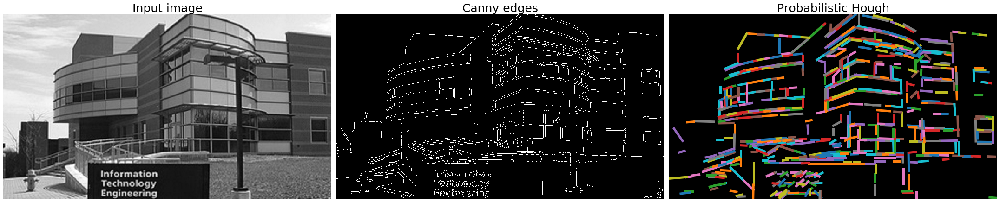

In [10]:
fig, axes = plt.subplots(1, 3, figsize=(30, 20), sharex=True, sharey=True)
ax = axes.ravel()
plt.gray()
ax[0].imshow(image, cmap=plt.cm.gray)
ax[0].set_title('Input image', size=25)
ax[1].imshow(edges, cmap=plt.cm.gray)
ax[1].set_title('Canny edges', size=25)
ax[2].imshow(edges * 0)
for line in lines:
 p0, p1 = line
 ax[2].plot((p0[0], p1[0]), (p0[1], p1[1]), linewidth=5)
ax[2].set_xlim((0, image.shape[1]))
ax[2].set_ylim((image.shape[0], 0))
ax[2].set_title('Probabilistic Hough', size=25)
for a in ax:
 a.set_axis_off()
plt.axis('off')
plt.tight_layout()
plt.show()

### 2.3 Detecting Objects of arbitrary shapes using Generalized Hough Transform

In [12]:
from matplotlib.pylab import imshow, title, show
from skimage.filters import threshold_otsu
import cv2
print(cv2.__version__)
# 4.3.0
import numpy as np
import matplotlib,pylab as plt

4.3.0


In [14]:
orig = cv2.imread('images/Img_06_03.png')
img = cv2.cvtColor(orig, cv2.COLOR_BGR2GRAY)
templ = cv2.imread('images/Img_06_04.png', 0)
edges = cv2.Canny(img, 130,150)

In [15]:
alg = cv2.createGeneralizedHoughBallard()
alg.setTemplate(templ)
[positions,votes] = alg.detect(edges)

In [16]:
clone = orig.copy() #np.dstack([edges, edges, edges])
for i in range(len(positions[0])):
    pos, scale, angle = positions[0][i][:2], positions[0][i][2], positions[0][i][3]
    print(pos, scale, angle)
    # need to write code here to rotate the bounding rect if angle is not zero and scale is not 1
    cv2.rectangle(clone, (int(pos[0]) - templ.shape[1]//2, int(pos[1]) - templ.shape[0]//2), 
                         (int(pos[0] + templ.shape[1]//2), int(pos[1] + templ.shape[0]//2)), 
                         (0,0,255), 2)

[61. 83.] 1.0 0.0
[60. 84.] 1.0 0.0


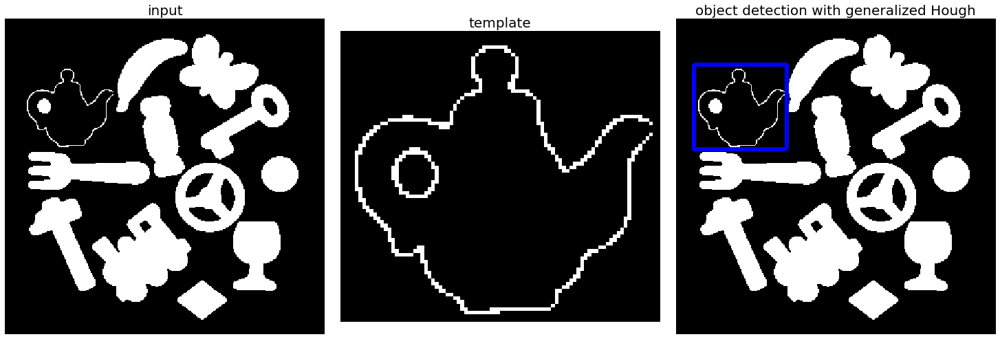

In [17]:
plt.figure(figsize=(20, 8))
plt.gray()
plt.subplots_adjust(0,0,1,0.975,0.05,0.05)
plt.subplot(131), plt.imshow(img), plt.axis('off'), plt.title('input', size=20)
plt.subplot(132), plt.imshow(templ), plt.axis('off'), plt.title('template', size=20)
plt.subplot(133), plt.imshow(clone), plt.axis('off'), plt.title('object detection with generalized Hough', size=20)
plt.show()

## 2. Object Saliency Map, Depth Map and Tone Map (HDR) with opencv-python

### 2.1 Creating Object Saliency Map

In [20]:
#pip install opencv-python==3.4.2.17 opencv-contrib-python==3.4.2.17
import cv2
import numpy as np
from matplotlib import pylab as plt

In [21]:
image = cv2.imread('images/Img_06_05.jpg')
saliency = cv2.saliency.StaticSaliencyFineGrained_create()
(success, saliency_map) = saliency.computeSaliency(image)

In [27]:
saliency_map = (255*saliency_map).astype(np.uint8)
thresh_map = cv2.threshold(saliency_map.astype("uint8"), 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]

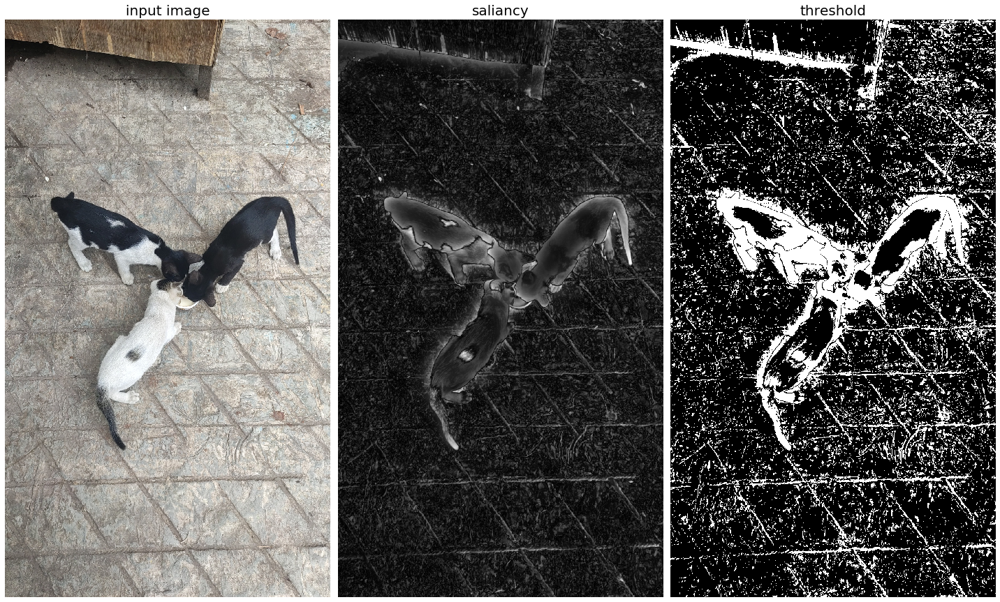

In [28]:
# show the images
plt.figure(figsize=(20,20))
plt.gray()
plt.subplot(131), plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)), plt.axis('off'), plt.title('input image', size=20)
plt.subplot(132), plt.imshow(saliency_map), plt.axis('off'), plt.title('saliancy', size=20)
plt.subplot(133), plt.imshow(thresh_map), plt.axis('off'), plt.title('threshold', size=20)
plt.tight_layout()
plt.show()

### 2.2 Creating Depth-Map from Stereo images

In [32]:
import cv2
import matplotlib.pylab as plt

img_left = cv2.imread('images/stereo/im0.ppm', 0)
img_right = cv2.imread('images/stereo/im1.ppm', 0)

In [33]:
matcher = cv2.StereoBM_create(numDisparities=16, blockSize=15)
disparity = matcher.compute(img_left, img_right)

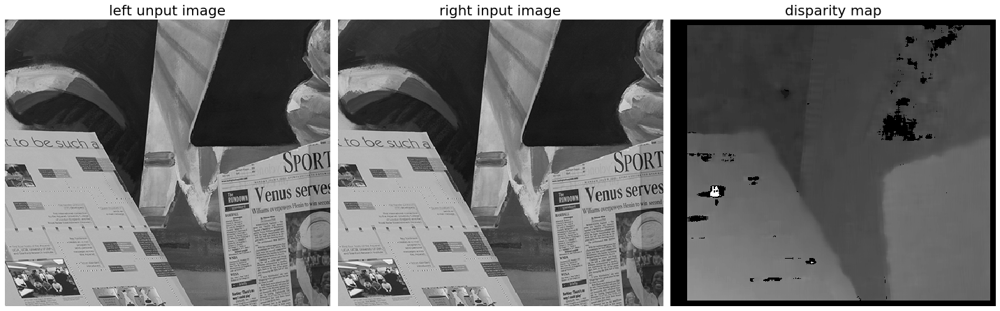

In [34]:
plt.figure(figsize=(20,20))
plt.gray()
plt.subplot(131), plt.imshow(img_left), plt.axis('off'), plt.title('left unput image', size=20)
plt.subplot(132), plt.imshow(img_right), plt.axis('off'), plt.title('right input image', size=20)
plt.subplot(133), plt.imshow(disparity), plt.axis('off'), plt.title('disparity map', size=20)
plt.tight_layout()
plt.show()

### 2.3 Tone mapping and High Dynamic Range (HDR) Imaging

In [2]:
# https://stackoverflow.com/questions/38926689/open-hdr-files-with-opencv
# pip install opencv-python==3.4.2.17 opencv-contrib-python==3.4.2.17

import cv2
print(cv2.__version__)
# 3.4.2
import numpy as np
#from skimage import img_as_ubyte
import matplotlib.pylab as plt

3.4.2


In [3]:
hdr_image = cv2.imread("images/hdr/GCanyon_C_YumaPoint_3k.hdr", -1)

In [4]:
tonemap_drago = cv2.createTonemapDrago(1.0, 0.7)
ldr_drago = tonemap_drago.process(hdr_image)
ldr_drago = 3 * ldr_drago
ldr_drago = cv2.cvtColor(ldr_drago, cv2.COLOR_BGR2RGB)

In [5]:
tonemap_durand = cv2.createTonemapDurand(1.5,4,1.0,1,1)
ldr_durand = tonemap_durand.process(hdr_image)
ldr_durand = 3 * ldr_durand
ldr_durand = cv2.cvtColor(ldr_durand, cv2.COLOR_BGR2RGB)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


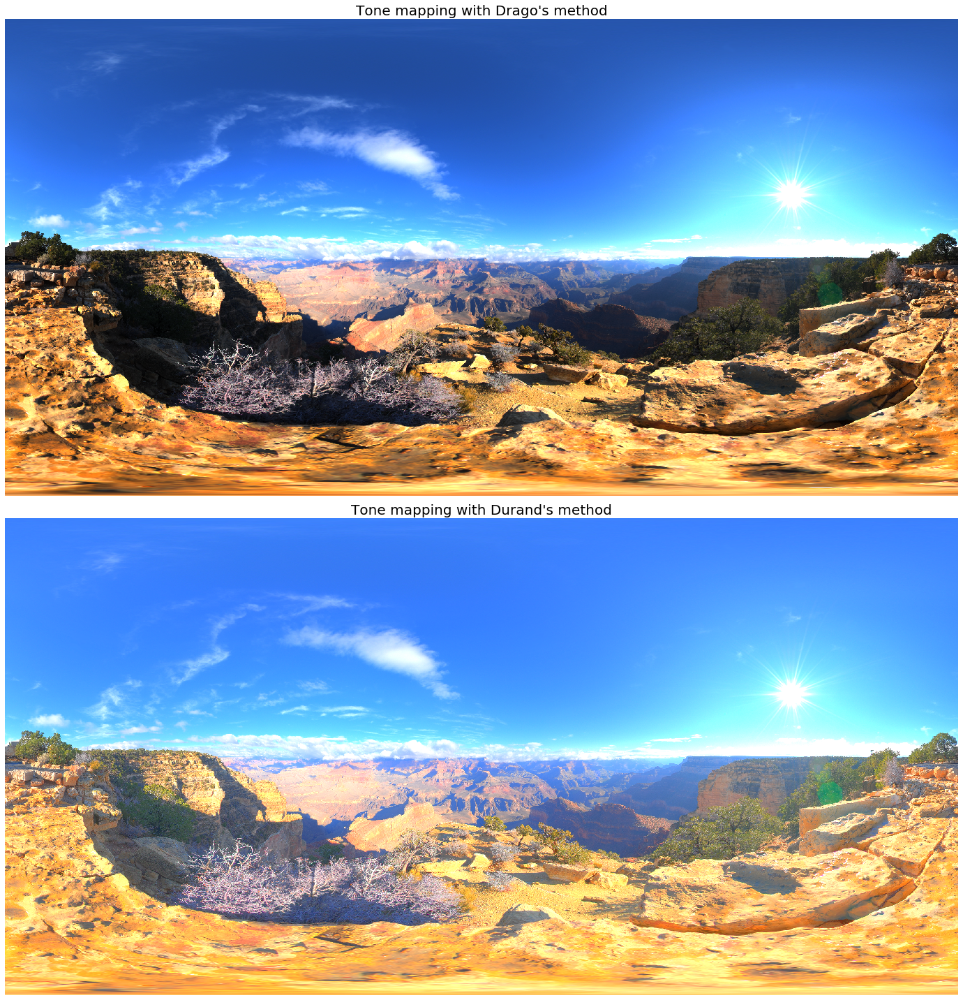

In [6]:
plt.figure(figsize=(20,20))
plt.subplot(211), plt.imshow(ldr_drago), plt.axis('off'), plt.title('Tone mapping with Drago\'s method', size=20)
plt.subplot(212), plt.imshow(ldr_durand), plt.axis('off'), plt.title('Tone mapping with Durand\'s method', size=20)
plt.tight_layout()
plt.show()

## 3. Pyramid Blending

In [7]:
import numpy as np
import matplotlib.pyplot as plt

from skimage.io import imread
from skimage.color import rgb2gray
from skimage.transform import pyramid_reduce, pyramid_laplacian, pyramid_expand, resize

In [26]:
def get_gaussian_pyramid(image):
    rows, cols, dim = image.shape
    gaussian_pyramid = [image]
    while rows > 1 and cols > 1:
        #print(rows, cols)
        image = pyramid_reduce(image, downscale=2, multichannel=True)
        gaussian_pyramid.append(image)
        #print(image.shape)
        rows //= 2
        cols //= 2
    return gaussian_pyramid

In [31]:
def get_laplacian_pyramid(gaussian_pyramid):
    laplacian_pyramid = [gaussian_pyramid[len(gaussian_pyramid)-1]]
    for i in range(len(gaussian_pyramid)-2, -1, -1):
        image = gaussian_pyramid[i] - resize(pyramid_expand(gaussian_pyramid[i+1], multichannel=True), gaussian_pyramid[i].shape)
        laplacian_pyramid.append(np.copy(image))
    laplacian_pyramid = laplacian_pyramid[::-1]
    return laplacian_pyramid

In [28]:
def reconstruct_image_from_laplacian_pyramid(pyramid):
    i = len(pyramid) - 2
    prev = pyramid[i+1]
    plt.figure(figsize=(20,18))
    j = 1
    while i >= 0:
        prev = resize(pyramid_expand(prev, upscale=2, multichannel=True), pyramid[i].shape)
        im = np.clip(pyramid[i] + prev,0,1)
        print(prev.shape, im.shape)
        plt.subplot(3,3,j)
        plt.imshow(im)
        plt.title('Level=' + str(j) + ', ' + str(im.shape[0]) + 'x' + str(im.shape[1]), size=20)
        prev = im
        i -= 1
        j += 1
    plt.suptitle('Image constructed from the Laplacian Pyramid', size=30)
    plt.show()
    return im

In [29]:
A = imread('images/Img_06_10.png')[...,:3] / 255
B = imread('images/Img_06_11.png')[...,:3] / 255
M = imread('images/Img_06_12.png')[...,:3] / 255


![](images/Img_06_13.png)

In [32]:
rows, cols, dim = A.shape
pyramidA = get_laplacian_pyramid(get_gaussian_pyramid(A))
pyramidB = get_laplacian_pyramid(get_gaussian_pyramid(B))
pyramidM = get_gaussian_pyramid(M)

In [33]:
pyramidC = []
for i in range(len(pyramidM)):
    im = pyramidM[i]*pyramidA[i] + (1-pyramidM[i])*pyramidB[i]
    #print(np.max(im), np.min(im), np.mean(im))
    pyramidC.append(im)

(4, 5, 3) (4, 5, 3)
(8, 10, 3) (8, 10, 3)
(15, 20, 3) (15, 20, 3)
(30, 39, 3) (30, 39, 3)
(60, 77, 3) (60, 77, 3)
(120, 153, 3) (120, 153, 3)
(240, 306, 3) (240, 306, 3)
(480, 612, 3) (480, 612, 3)


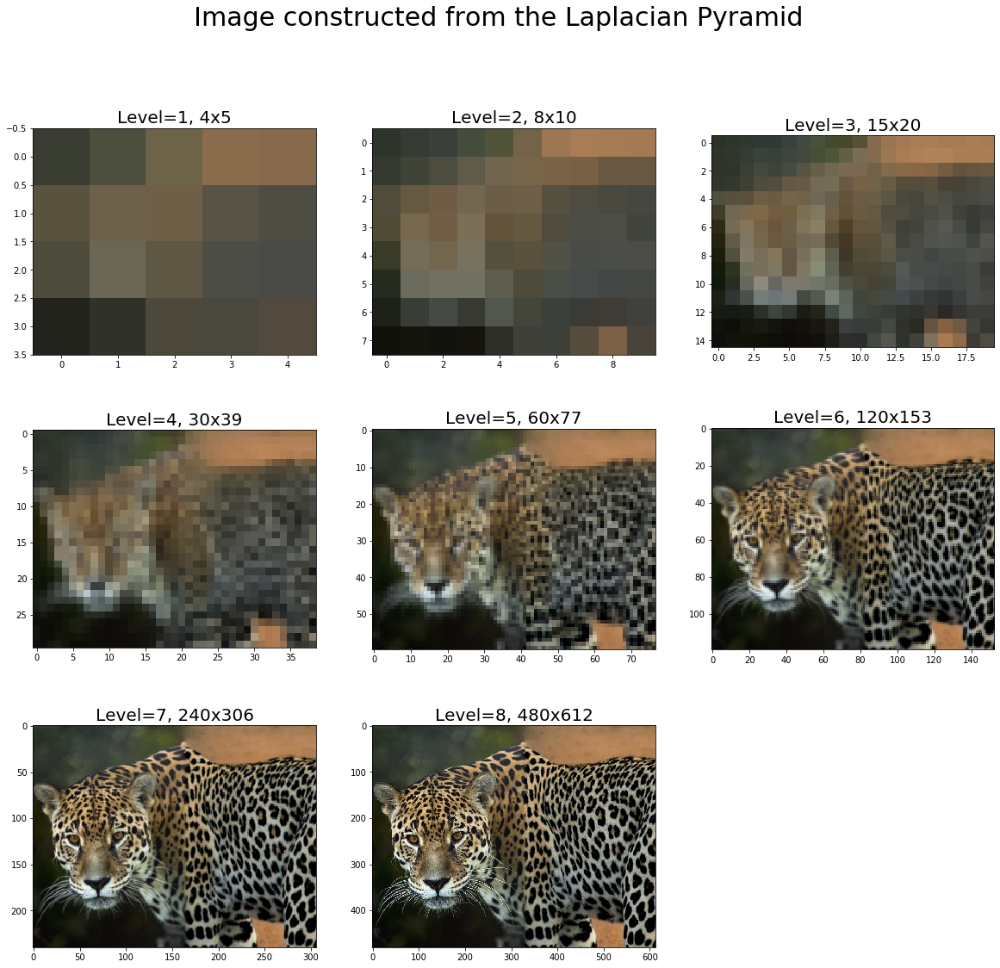

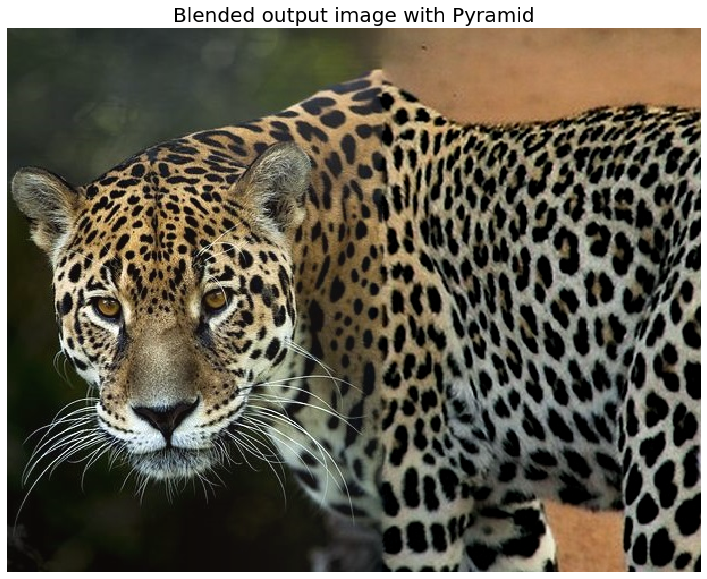

In [34]:
im = reconstruct_image_from_laplacian_pyramid(pyramidC)

plt.figure(figsize=(20,10))
plt.imshow(im), plt.axis('off'), plt.title('Blended output image with Pyramid', size=20)
plt.show()

## 4. Image Super Resolution with deep learning model (SRGAN)

In [36]:
import tensorflow as tf
tf.compat.v1.enable_eager_execution() 

from tensorflow.python.keras.layers import Add, BatchNormalization, Conv2D, Dense, Flatten, Input, LeakyReLU, PReLU, Lambda
from tensorflow.python.keras.models import Model
from tensorflow.python.keras.applications.vgg19 import VGG19
from PIL import Image
import os
import numpy as np
import matplotlib.pyplot as plt

In [37]:
def normalize_01(x):
    """Normalizes RGB images to [0, 1]."""
    return x / 255.0

def normalize_m11(x):
    """Normalizes RGB images to [-1, 1]."""
    return x / 127.5 - 1

def denormalize_m11(x):
    """Inverse of normalize_m11."""
    return (x + 1) * 127.5

def pixel_shuffle(scale):
    return lambda x: tf.nn.depth_to_space(x, scale)

def upsample(x_in, num_filters):
    x = Conv2D(num_filters, kernel_size=3, padding='same')(x_in)
    x = Lambda(pixel_shuffle(scale=2))(x)
    return PReLU(shared_axes=[1, 2])(x)

In [38]:
def res_block(x_in, num_filters, momentum=0.8):
    x = Conv2D(num_filters, kernel_size=3, padding='same')(x_in)
    x = BatchNormalization(momentum=momentum)(x)
    x = PReLU(shared_axes=[1, 2])(x)
    x = Conv2D(num_filters, kernel_size=3, padding='same')(x)
    x = BatchNormalization(momentum=momentum)(x)
    x = Add()([x_in, x])
    return x

In [39]:
def sr_resnet(num_filters=64, num_res_blocks=16):
    x_in = Input(shape=(None, None, 3))
    x = Lambda(normalize_01)(x_in)

    x = Conv2D(num_filters, kernel_size=9, padding='same')(x)
    x = x_1 = PReLU(shared_axes=[1, 2])(x)

    for _ in range(num_res_blocks):
        x = res_block(x, num_filters)

    x = Conv2D(num_filters, kernel_size=3, padding='same')(x)
    x = BatchNormalization()(x)
    x = Add()([x_1, x])

    x = upsample(x, num_filters * 4)
    x = upsample(x, num_filters * 4)

    x = Conv2D(3, kernel_size=9, padding='same', activation='tanh')(x)
    x = Lambda(denormalize_m11)(x)

    return Model(x_in, x)

In [40]:
generator = sr_resnet

In [41]:
LR_SIZE = 24
HR_SIZE = 96

def discriminator_block(x_in, num_filters, strides=1, batchnorm=True, momentum=0.8):
    x = Conv2D(num_filters, kernel_size=3, strides=strides, padding='same')(x_in)
    if batchnorm:
        x = BatchNormalization(momentum=momentum)(x)
    return LeakyReLU(alpha=0.2)(x)

def discriminator(num_filters=64):
    x_in = Input(shape=(HR_SIZE, HR_SIZE, 3))
    x = Lambda(normalize_m11)(x_in)

    x = discriminator_block(x, num_filters, batchnorm=False)
    x = discriminator_block(x, num_filters, strides=2)

    x = discriminator_block(x, num_filters * 2)
    x = discriminator_block(x, num_filters * 2, strides=2)

    x = discriminator_block(x, num_filters * 4)
    x = discriminator_block(x, num_filters * 4, strides=2)

    x = discriminator_block(x, num_filters * 8)
    x = discriminator_block(x, num_filters * 8, strides=2)

    x = Flatten()(x)

    x = Dense(1024)(x)
    x = LeakyReLU(alpha=0.2)(x)
    x = Dense(1, activation='sigmoid')(x)

    return Model(x_in, x)

In [42]:
def resolve_single(model, lr):
    return resolve(model, tf.expand_dims(lr, axis=0))[0]

def resolve(model, lr_batch):
    lr_batch = tf.cast(lr_batch, tf.float32)
    sr_batch = model(lr_batch)
    sr_batch = tf.clip_by_value(sr_batch, 0, 255)
    sr_batch = tf.round(sr_batch)
    sr_batch = tf.cast(sr_batch, tf.uint8)
    return sr_batch

In [43]:
# Location of model weights
weights_dir = 'models/srgan'
weights_file = lambda filename: os.path.join(weights_dir, filename)

In [45]:
#Generator fine-tuning (GAN)
gan_generator = generator()
gan_generator.load_weights(weights_file('pre_generator.h5'))

In [46]:
lr = Image.open('images/Img_06_16.jpg')
sr = lr.resize((lr.width*4, lr.height*4), Image.BICUBIC)
lr, sr = np.array(lr), np.array(sr)
#print(imfile, sr.shape)
gan_sr = resolve_single(gan_generator, lr)
gan_sr = gan_sr.numpy()
gan_sr = gan_sr / gan_sr.max()
#print(lr.shape, gan_sr.shape)

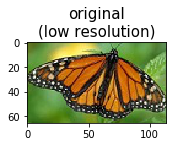

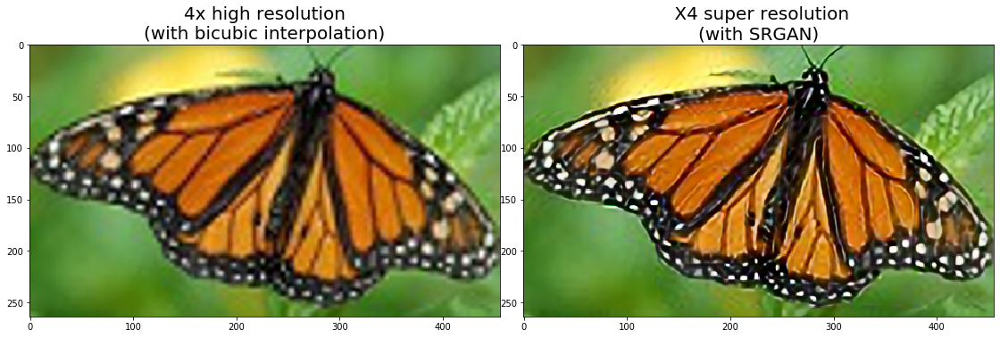

In [47]:
plt.figure(figsize=(2.5, 1.5))
plt.imshow(lr), plt.title('original\n(low resolution)', size=15)
plt.show()
plt.figure(figsize=(15, 9))
plt.subplots_adjust(0,0,1,1,0.05,0.05)
images = [sr, gan_sr]
titles = ['4x high resolution\n(with bicubic interpolation)', ' X4 super resolution\n(with SRGAN)']
positions = [1, 2]
for i, (img, title, pos) in enumerate(zip(images, titles, positions)):
    plt.subplot(1, 2, pos)
    plt.imshow(img)
    plt.title(title, size=20)
plt.show()

![](../images/srgan.gif)

## 5. Low-light Image Enhancement Using CNNs


![](images/Img_06_18.png)



In [ ]:
import tensorflow as tf
print(tf.__version__)
# 2.0.0
import numpy as np
from skimage.io import imread
import matplotlib.pylab as plt
from tensorflow.keras.layers import Input, Conv2D, Conv2DTranspose, Concatenate
from tensorflow.keras.applications.vgg19 import VGG19
from tensorflow.keras.models import Model

In [49]:
def build_mbllen(input_shape):

    def EM(input, kernal_size, channel):
        conv_1 = Conv2D(channel, (3, 3), activation='relu', padding='same', data_format='channels_last')(input)
        conv_2 = Conv2D(channel, (kernal_size, kernal_size), activation='relu', padding='valid', data_format='channels_last')(conv_1)
        conv_3 = Conv2D(channel*2, (kernal_size, kernal_size), activation='relu', padding='valid', data_format='channels_last')(conv_2)
        conv_4 = Conv2D(channel*4, (kernal_size, kernal_size), activation='relu', padding='valid', data_format='channels_last')(conv_3)
        conv_5 = Conv2DTranspose(channel*2, (kernal_size, kernal_size), activation='relu', padding='valid', data_format='channels_last')(conv_4)
        conv_6 = Conv2DTranspose(channel, (kernal_size, kernal_size), activation='relu', padding='valid', data_format='channels_last')(conv_5)
        res = Conv2DTranspose(3, (kernal_size, kernal_size), activation='relu', padding='valid', data_format='channels_last')(conv_6)
        return res

    inputs = Input(shape=input_shape)
    FEM = Conv2D(32, (3, 3), activation='relu', padding='same', data_format='channels_last')(inputs)
    EM_com = EM(FEM, 5, 8)

    for j in range(3):
        for i in range(0, 3):
            FEM = Conv2D(32, (3, 3), activation='relu', padding='same', data_format='channels_last')(FEM)
            EM1 = EM(FEM, 5, 8)
            EM_com = Concatenate(axis=3)([EM_com, EM1])

    outputs = Conv2D(3, (1, 1), activation='relu', padding='same', data_format='channels_last')(EM_com)
    return Model(inputs, outputs)

In [50]:
mbllen = build_mbllen((None, None, 3))
mbllen.load_weights('models/LOL_img_lowlight.h5')

In [52]:
img = imread('images/Img_06_19.jpg')
print(img.max())
out_pred = mbllen.predict(img[np.newaxis, :] / 255)
out = out_pred[0, :, :, :3]

255


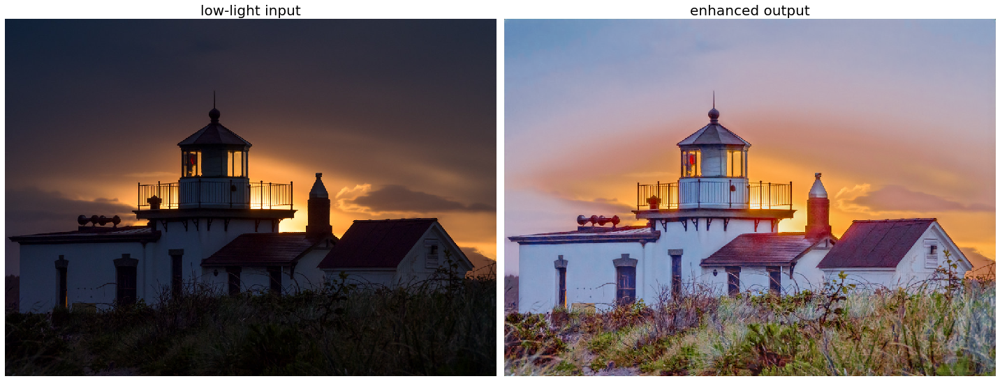

In [54]:
def plot_image(image, title=None, sz=20):
    plt.imshow(image)
    plt.title(title, size=sz)
    plt.axis('off')

plt.figure(figsize=(20,10))
plt.subplot(121), plot_image(img, 'low-light input')
plt.subplot(122), plot_image(np.clip(out, 0, 1), 'enhanced output')
plt.tight_layout()
plt.show()

![](../images/dehazing.gif)

## 6. Realistic Image Dehazing using Deep Neural Network

![](images/Img_06_20.png)

In [55]:
# pip install torch==1.4.0+cpu torchvision==0.5.0+cpu -f https://download.pytorch.org/whl/torch_stable.html
# https://stackoverflow.com/questions/56859803/modulenotfounderror-no-module-named-tools-nnwrap
import torch
import torch.nn as nn
import torch.nn.functional as F
from PIL import Image
from torch.autograd import Variable
from torchvision.transforms import ToTensor, ToPILImage, Normalize, Resize
#from torchviz import make_dot
import matplotlib.pylab as plt

In [56]:
class ConvLayer(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, stride):
        super(ConvLayer, self).__init__()
        reflection_padding = kernel_size // 2
        self.reflection_pad = nn.ReflectionPad2d(reflection_padding)
        self.conv2d = nn.Conv2d(in_channels, out_channels, kernel_size, stride)

    def forward(self, x):
        out = self.reflection_pad(x)
        out = self.conv2d(out)
        return out

class UpsampleConvLayer(torch.nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, stride):
      super(UpsampleConvLayer, self).__init__()
      reflection_padding = kernel_size // 2
      self.reflection_pad = torch.nn.ReflectionPad2d(reflection_padding)
      self.conv2d = nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride=stride)

    def forward(self, x):
        out = self.reflection_pad(x)
        out = self.conv2d(out)
        return out

In [57]:
class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super(ResidualBlock, self).__init__()
        self.conv1 = ConvLayer(channels, channels, kernel_size=3, stride=1)
        self.conv2 = ConvLayer(channels, channels, kernel_size=3, stride=1)
        self.relu = nn.PReLU()

    def forward(self, x):
        residual = x
        out = self.relu(self.conv1(x))
        out = self.conv2(out) * 0.1
        out = torch.add(out, residual)
        return out

In [58]:
class MeanShift(nn.Conv2d):
    def __init__(self, rgb_range, rgb_mean, sign):
        super(MeanShift, self).__init__(3, 3, kernel_size=1)
        self.weight.data = torch.eye(3).view(3, 3, 1, 1)
        self.bias.data = float(sign) * torch.Tensor(rgb_mean) * rgb_range

        # Freeze the MeanShift layer
        for params in self.parameters():
            params.requires_grad = False

In [59]:
class Net(nn.Module):
    def __init__(self, res_blocks=18):
        super(Net, self).__init__()

        rgb_mean = (0.5204, 0.5167, 0.5129)
        self.sub_mean = MeanShift(1., rgb_mean, -1)
        self.add_mean = MeanShift(1., rgb_mean, 1)

        self.conv_input = ConvLayer(3, 16, kernel_size=11, stride=1)
        self.conv2x = ConvLayer(16, 32, kernel_size=3, stride=2)
        self.conv4x = ConvLayer(32, 64, kernel_size=3, stride=2)
        self.conv8x = ConvLayer(64, 128, kernel_size=3, stride=2)
        self.conv16x = ConvLayer(128, 256, kernel_size=3, stride=2)

        self.dehaze = nn.Sequential()
        for i in range(1, res_blocks):
            self.dehaze.add_module('res%d' % i, ResidualBlock(256))

        self.convd16x = UpsampleConvLayer(256, 128, kernel_size=3, stride=2)
        self.convd8x = UpsampleConvLayer(128, 64, kernel_size=3, stride=2)
        self.convd4x = UpsampleConvLayer(64, 32, kernel_size=3, stride=2)
        self.convd2x = UpsampleConvLayer(32, 16, kernel_size=3, stride=2)

        self.conv_output = ConvLayer(16, 3, kernel_size=3, stride=1)

        self.relu = nn.LeakyReLU(0.2)

    def forward(self, x):
        x = self.relu(self.conv_input(x))
        res2x = self.relu(self.conv2x(x))
        res4x = self.relu(self.conv4x(res2x))

        res8x = self.relu(self.conv8x(res4x))
        res16x = self.relu(self.conv16x(res8x))

        res_dehaze = res16x
        res16x = self.dehaze(res16x)
        res16x = torch.add(res_dehaze, res16x)

        res16x = self.relu(self.convd16x(res16x))
        res16x = F.upsample(res16x, res8x.size()[2:], mode='bilinear')
        res8x = torch.add(res16x, res8x)

        res8x = self.relu(self.convd8x(res8x))
        res8x = F.upsample(res8x, res4x.size()[2:], mode='bilinear')
        res4x = torch.add(res8x, res4x)

        res4x = self.relu(self.convd4x(res4x))
        res4x = F.upsample(res4x, res2x.size()[2:], mode='bilinear')
        res2x = torch.add(res4x, res2x)

        res2x = self.relu(self.convd2x(res2x))
        res2x = F.upsample(res2x, x.size()[2:], mode='bilinear')
        x = torch.add(res2x, x)

        x = self.conv_output(x)

        return x

In [60]:
rb = 13
checkpoint = "models/I-HAZE_O-HAZE.pth"

In [61]:
net = Net(rb)
net.load_state_dict(torch.load(checkpoint)['state_dict'])
net.eval()

Net(
  (sub_mean): MeanShift(3, 3, kernel_size=(1, 1), stride=(1, 1))
  (add_mean): MeanShift(3, 3, kernel_size=(1, 1), stride=(1, 1))
  (conv_input): ConvLayer(
    (reflection_pad): ReflectionPad2d((5, 5, 5, 5))
    (conv2d): Conv2d(3, 16, kernel_size=(11, 11), stride=(1, 1))
  )
  (conv2x): ConvLayer(
    (reflection_pad): ReflectionPad2d((1, 1, 1, 1))
    (conv2d): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
  )
  (conv4x): ConvLayer(
    (reflection_pad): ReflectionPad2d((1, 1, 1, 1))
    (conv2d): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2))
  )
  (conv8x): ConvLayer(
    (reflection_pad): ReflectionPad2d((1, 1, 1, 1))
    (conv2d): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2))
  )
  (conv16x): ConvLayer(
    (reflection_pad): ReflectionPad2d((1, 1, 1, 1))
    (conv2d): Conv2d(128, 256, kernel_size=(3, 3), stride=(2, 2))
  )
  (dehaze): Sequential(
    (res1): ResidualBlock(
      (conv1): ConvLayer(
        (reflection_pad): ReflectionPad2d((1, 1, 1, 1))
        

In [62]:
im_path = "images/Img_06_21.jpg"
im = Image.open(im_path)
h, w = im.size
print(h, w)
# 1600 1200

1600 1200


In [65]:
imt = ToTensor()(im)
imt = Variable(imt).view(1, -1, w, h)
#im = im.cuda()
with torch.no_grad():
    imt = net(imt)
out = torch.clamp(imt, 0., 1.)
out = out.cpu()
out = out.data[0]
out = ToPILImage()(out)

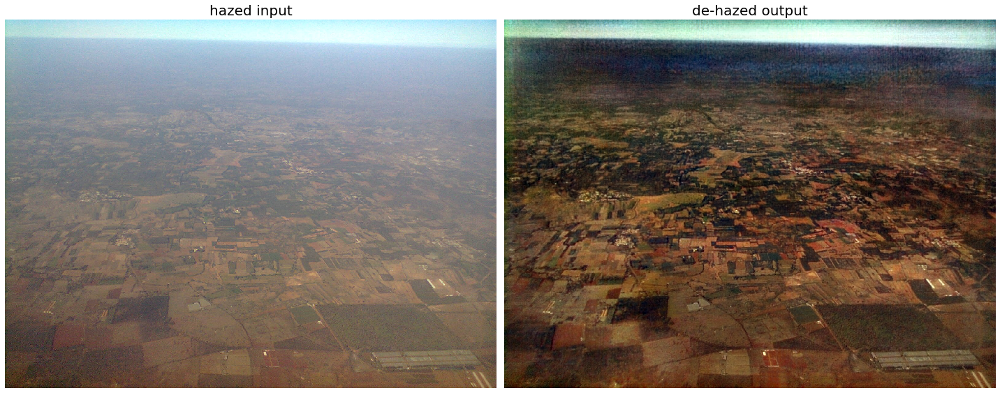

In [66]:
plt.figure(figsize=(20,10))
plt.subplot(121), plot_image(im, 'hazed input')
plt.subplot(122), plot_image(out, 'de-hazed output')
plt.tight_layout()
plt.show()

## 7. Distributed Image Processing with Dask

In [67]:
# !pip install dask, dask_image
from skimage.io import imread, imsave
from skimage.color import rgb2gray
import numpy as np
import matplotlib.pylab as plt
import dask_image.imread
import dask.array
import dask_image.ndfilters
import os, glob
from IPython.display import display

In [68]:
def partion_image(imgfile, n_h=2, n_w=2, plot=True):
    im = imread(imgfile)
    h, w, _ = im.shape
    h_s, w_s = h // n_h, w // n_w
    k = 0
    for i in range(n_h):
        for j in range(n_w):
            imsave(imgfile[:-4] + '_part_{:03d}'.format(k) + imgfile[-4:], im[i*h_s:(i+1)*h_s, j*w_s:(j+1)*w_s, :])          
            k += 1
    if plot:
        k = 0
        plt.figure(figsize=(20,16))
        plt.subplots_adjust(0,0,1,1,0.05,0.05)
        for i in range(n_h):
            for j in range(n_w):
                im = plt.imread(imgfile[:-4] + '_part_{:03d}'.format(k) + imgfile[-4:])
                plt.subplot(n_h, n_w, k+1), plt.imshow(im), plt.title('image part-{}'.format(k+1), size=20)
                k += 1
        plt.show()

# plot an image        
def plot_image(image):
    plt.figure(figsize=(20,20))
    plt.imshow(image, cmap='gray')
    plt.show()

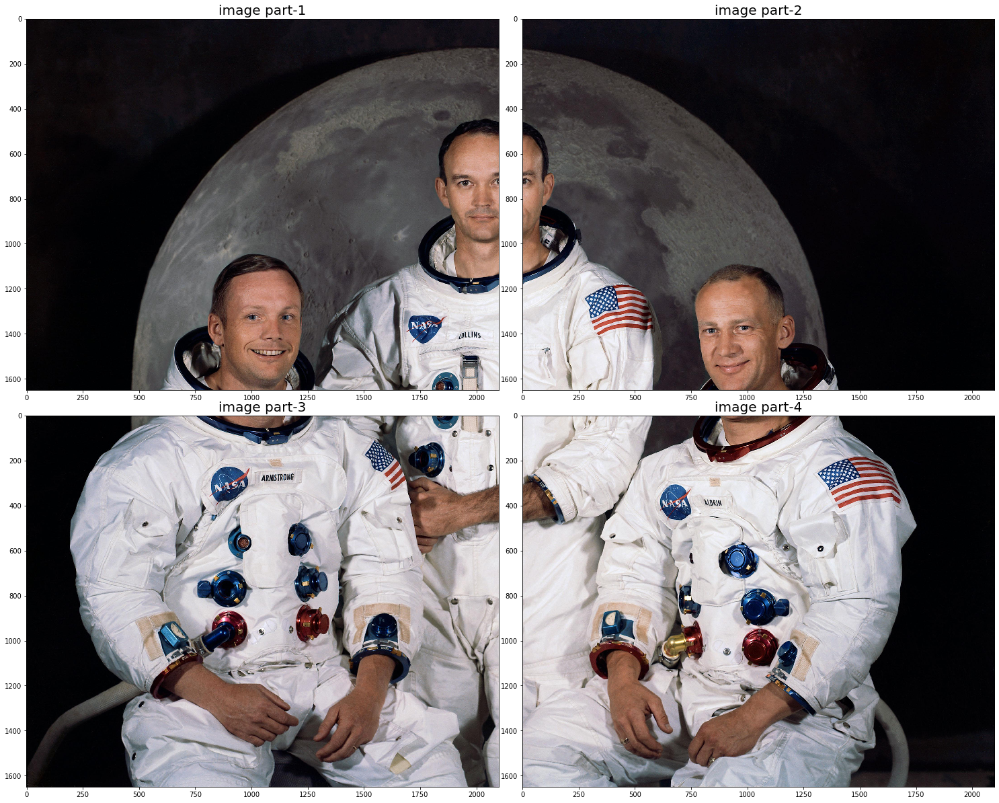

In [69]:
imgfile = 'images/Img_06_22.png'
partion_image(imgfile)

In [70]:
filename_pattern = os.path.join('./', imgfile[:-4] + '_part_*' + imgfile[-4:])
partitioned_images = dask_image.imread.imread(filename_pattern)
print(partitioned_images)

dask.array<concatenate, shape=(4, 1650, 2100, 3), dtype=uint8, chunksize=(1, 1650, 2100, 3), chunktype=numpy.ndarray>


(4, 1650, 2100)


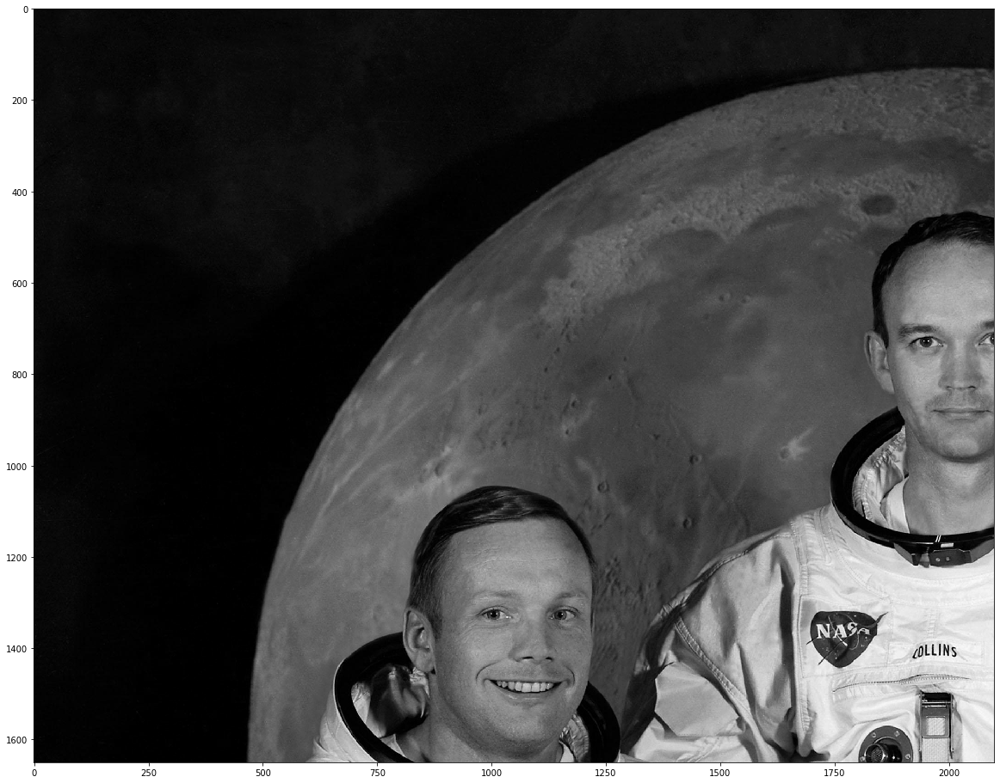

In [71]:
result  = (rgb2gray(partitioned_images))
print(result.shape)
plot_image(result[0])

(3300, 4200)


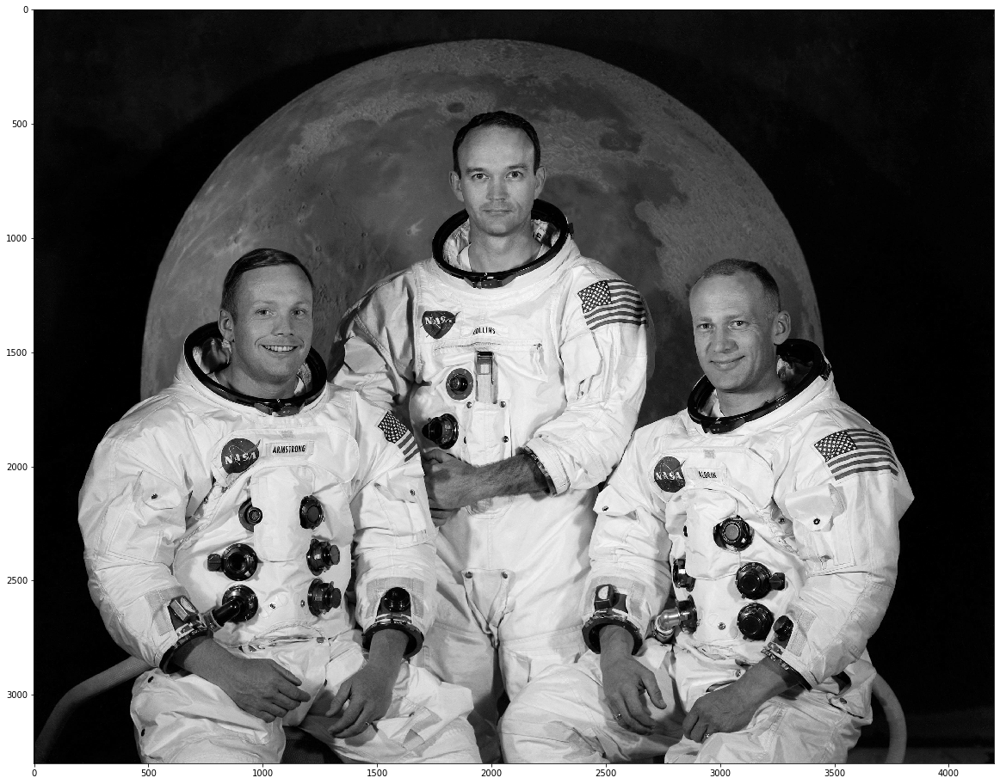

In [72]:
data = [result[i, ...] for i in range(result.shape[0])]
data = [data[i:i+2] for i in range(0, len(data), 2)]
combined_image = dask.array.block(data)
print(combined_image.shape)    
plot_image(combined_image)

dask.array<_trim, shape=(3300, 4200), dtype=float64, chunksize=(1650, 2100), chunktype=numpy.ndarray>


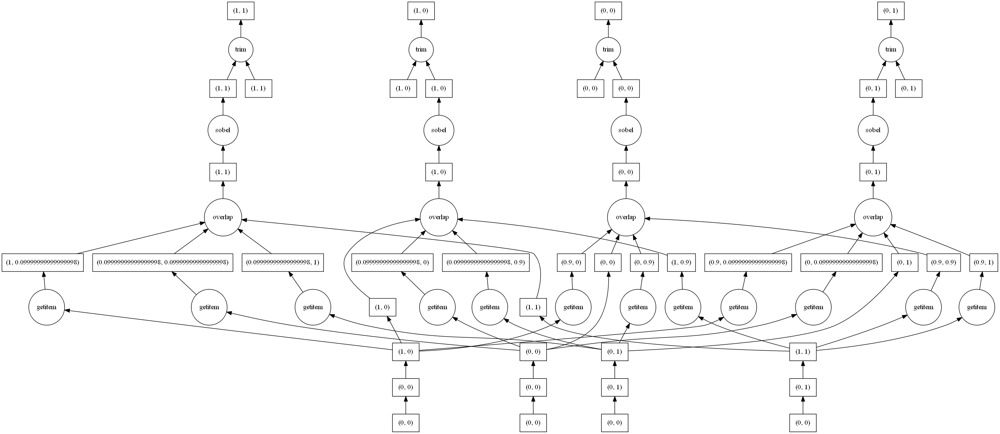

In [73]:
edges = dask_image.ndfilters.sobel(combined_image)
print(edges)
display(edges.visualize())

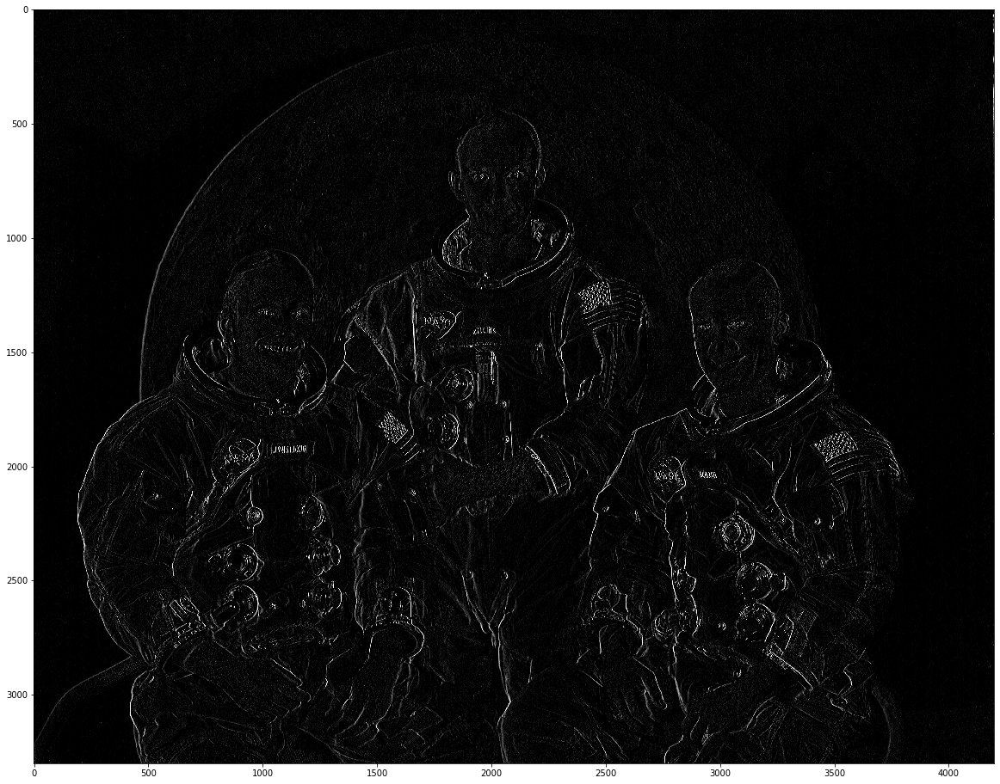

In [74]:
edges = np.clip(edges, 0, 1)
plot_image(edges)